In [1]:
using Distributed
using Random
using Plots

In [2]:
ENV["JULIA_DEBUG"] = ""

""

In [3]:
addprocs(3); # add worker processes

In [4]:
@everywhere using RLInterface
@everywhere using ContinuumWorld
@everywhere using SoftActorCritic

In [5]:
Random.seed!(2001)
sac = SAC(; 
    env_fn=()->MDPEnvironment(CWorld(; stdev=(0.1,0.1))), 
    obs_dim=2, 
    act_dim=2, 
    act_mins=[-1.0, -1.0],
    act_maxs=[1.0, 1.0],
    epochs=200,
    steps_per_epoch=240,
    update_every=60
)

SAC(var"#1#2"(), 2, 2, [-1.0, -1.0], [1.0, 1.0], 0.95, 100000, [100, 100, 100], NNlib.swish, Flux.Optimise.ADAM(0.001, (0.9, 0.999), IdDict{Any,Any}()), Flux.Optimise.ADAM(0.001, (0.9, 0.999), IdDict{Any,Any}()), Flux.Optimise.ADAM(0.001, (0.9, 0.999), IdDict{Any,Any}()), 64, 200, 240, 1000, 50, 300, 60, 0.995, -2.0, 200, Random._GLOBAL_RNG())

In [6]:
ac, info = distributed_solve(sac::SAC)

(SoftActorCritic.MLPActorCritic(SoftActorCritic.SquashedGaussianMLPActor(Chain(Dense(2, 100, swish), Dense(100, 100, swish), Dense(100, 100, swish)), Dense(100, 2), Dense(100, 2), [-1.0, -1.0], [1.0, 1.0], Random._GLOBAL_RNG()), SoftActorCritic.MLPQFunction(Chain(Dense(4, 100, swish), Dense(100, 100, swish), Dense(100, 100, swish), Dense(100, 1))), SoftActorCritic.MLPQFunction(Chain(Dense(4, 100, swish), Dense(100, 100, swish), Dense(100, 100, swish), Dense(100, 1)))), Dict{String,Any}("scores" => Any[-0.605, -0.64, -0.425, -0.475, 0.235, -0.065, -0.335, 0.345, 0.365, 2.225  …  9.075, 9.57, 9.54, 9.63, 9.3, 9.295, 9.185, 9.56, 9.655, 9.34],"replay_buffer" => SoftActorCritic.ReplayBuffer(Float32[1.645658 3.618284 … 0.0 0.0; 1.7732885 9.732164 … 0.0 0.0], Float32[0.27888012 0.58581156 … 0.0 0.0; 73.251564 194.14415 … 0.0 0.0], Float32[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0  …  0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], Float32[-1.0 -1.0 … 0.0 0.0; -1.0 -1.0 … 0.0 0.0], 

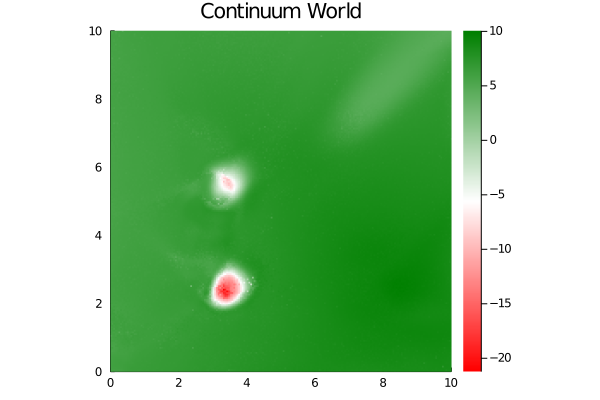

In [7]:
env = sac.env_fn()
plot(CWorldVis(env.problem, f=s->min(ac.q1(s,ac(s))[],ac.q2(s,ac(s))[])))

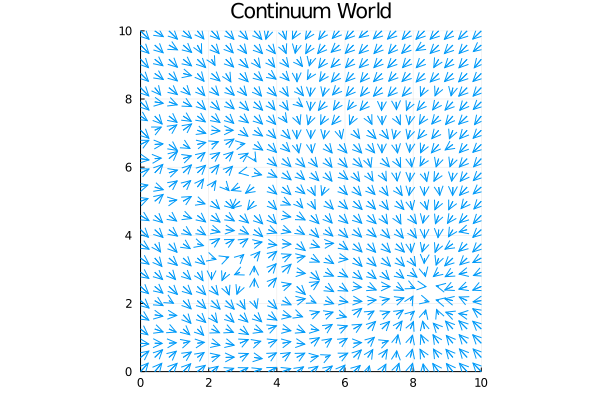

In [8]:
plot(CWorldVis(env.problem, fq=s->0.25.*ac(s)))

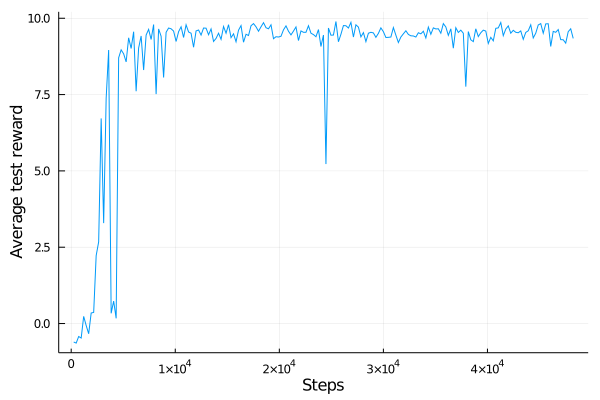

In [9]:
scores = info["scores"]
plot([i*sac.steps_per_epoch for i=1:length(scores)], scores, ylabel="Average test reward", xlabel="Steps", legend=false)

In [10]:
replay_buffer = info["replay_buffer"]
p = scatter(replay_buffer.obs_buf[1,1:replay_buffer.size], replay_buffer.obs_buf[2,1:replay_buffer.size], markersize=1, xlim=env.problem.xlim, ylim=env.problem.ylim,legend=false, title="Replay Buffer States")